# Neutrino underwater acoustic propagation modeling at Tanganyika

In [3]:
from math import *
import math
import matplotlib.pyplot as plt
import arlpy.uwapm as pm
import numpy as np
import bokeh

In [1]:
# put in neutrino energy in GeV
neutrino_energy = [1e12, 1e13, 1e14, 1e15, 1e16]

# put in detection threshold in micropascal
detection_threshold = 5000

# define the frequency of the signal you want to research
freq = 10000

# define the loudness of the wind noise in the frequency that you are trying to detect in dB for sea state 0, 1, 2, 3, 4
noise = [23.631547596452776, 33.11838057695792, 37.460864282392095, 41.22060669579062, 44.8447510320492]

# p. 22 of https://inspirehep.net/files/2503aef6f043cd5fd73d7a3963167070 for sea state 0, 1, 3, 6
noise1 = [15.847833789965078, 24.60897842756548, 34.32006687269598, 42.00741090235126]

In [4]:
# a formula that calculates amplitude based on perkin
def get_amplitude(neutrino_energy):
    """
    Generates the maximum amplitude in Pa of a neutrino with E = neutrino_energy at a distance of 1km from the source.
    """    
    # define the Bjorken-y variable
    y = 0.25
    
    # define the translation factor following Perkin (J. Perkin, ‘The acoustic detection of ultra high energy neutrinos,’ Ph.D. dissertation, TheUniversity of Sheffield, Jan. 2008)
    kv = 21.15 * 10**(-12)

    
    # calculate the corresponding amplitude of the original signal in Pa at 1km distance from the neutrino axis
    amplitude = y * kv * neutrino_energy
    
    return amplitude

dB_energies = []

for i in range(0, len(neutrino_energy)):
    energy = neutrino_energy[i]
    p_norm_1km = get_amplitude(energy)   
    # transform the 1km amplitude to the original amplitude by using the graph in the original notebook (Neutrino Signal)
    p_norm = p_norm_1km * (10 / 4) 

    print(f'The amplitude of the signal is {round(p_norm_1km, 4)} Pa at 1 km distance.')
    print(f'The amplitude of the signal at the source is approximately {round(p_norm, 4)} Pa.')

    # define the original signal amplitude in dB re uPa
    dB_1km = 20 * np.log10(p_norm_1km * 1e6)
    dB = 20 * np.log10(p_norm * 1e6)
    dB_energies.append(dB)
    
    dB_threshold = 20 * np.log10(detection_threshold)
    
    print(f'The amplitude of the signal is {round(dB_1km, 4)} dB re 1 uPa at 1 km distance.')
    print(f'The amplitude of the signal at the source is approximately {round(dB, 4)} dB re 1 uPa.')
    print(f'The amplitude of the signal that is still detectable is around {round(dB_threshold, 4)} dB re 1 uPa.')
    print('--------------------------------------------------------------------------------------------------------')

The amplitude of the signal is 5.2875 Pa at 1 km distance.
The amplitude of the signal at the source is approximately 13.2188 Pa.
The amplitude of the signal is 134.465 dB re 1 uPa at 1 km distance.
The amplitude of the signal at the source is approximately 142.4238 dB re 1 uPa.
The amplitude of the signal that is still detectable is around 73.9794 dB re 1 uPa.
--------------------------------------------------------------------------------------------------------
The amplitude of the signal is 52.875 Pa at 1 km distance.
The amplitude of the signal at the source is approximately 132.1875 Pa.
The amplitude of the signal is 154.465 dB re 1 uPa at 1 km distance.
The amplitude of the signal at the source is approximately 162.4238 dB re 1 uPa.
The amplitude of the signal that is still detectable is around 73.9794 dB re 1 uPa.
--------------------------------------------------------------------------------------------------------
The amplitude of the signal is 528.75 Pa at 1 km distance.
Th

In [5]:
print(dB_energies)

[142.4238077811027, 162.42380778110274, 182.42380778110274, 202.42380778110274, 222.42380778110274]


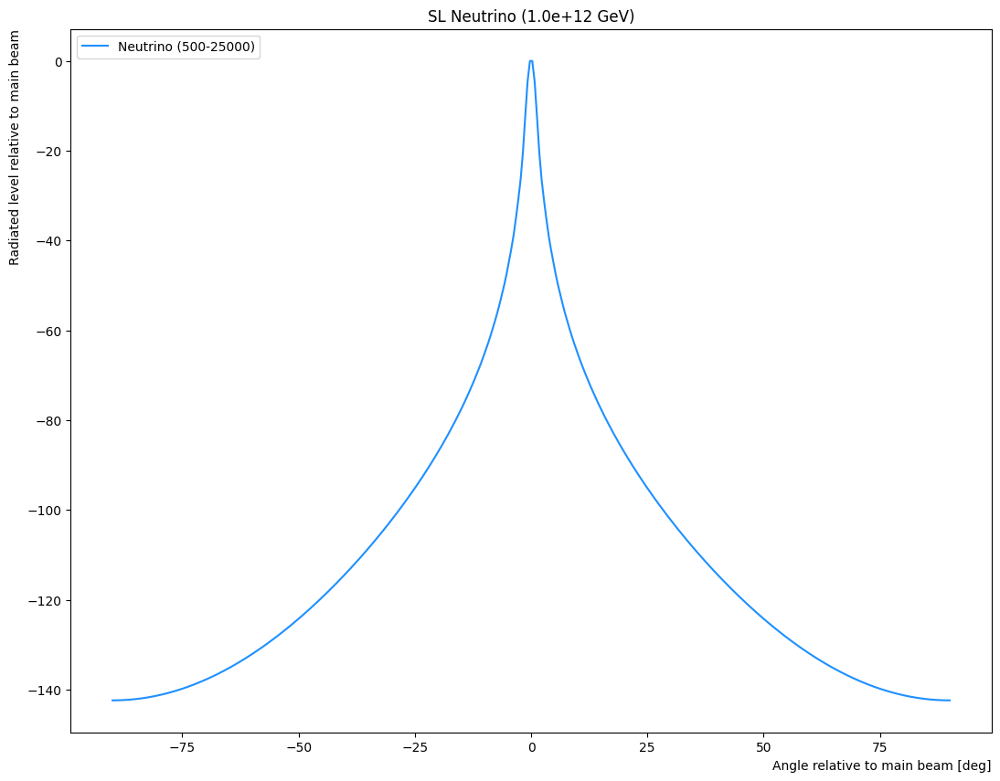

<Figure size 640x480 with 0 Axes>

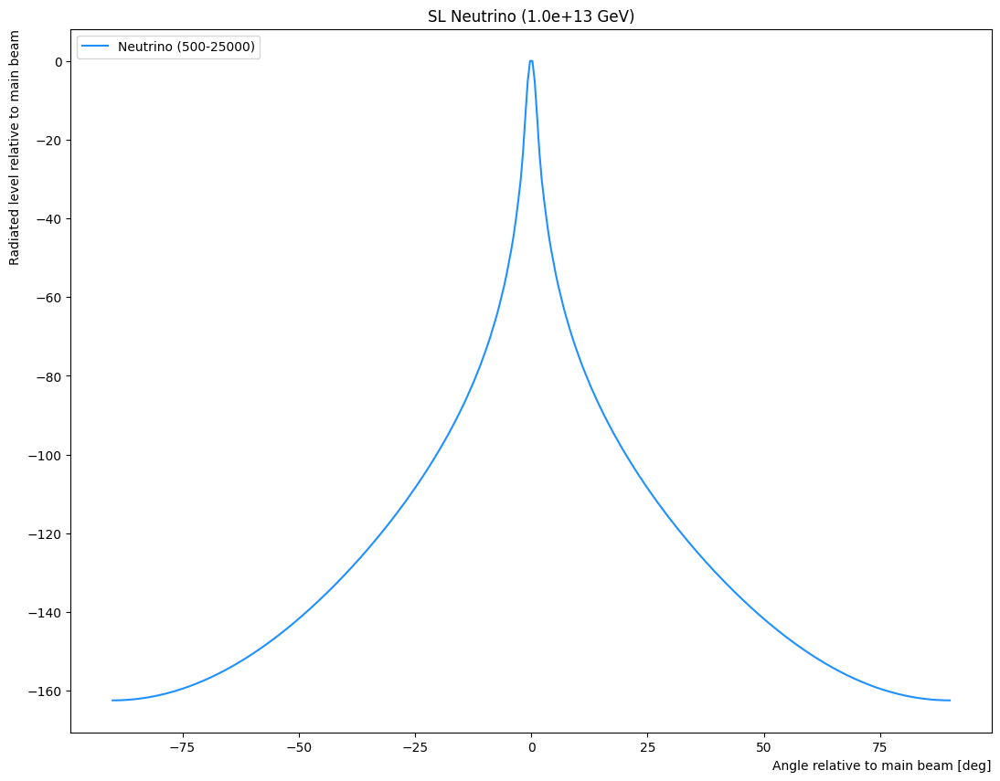

<Figure size 640x480 with 0 Axes>

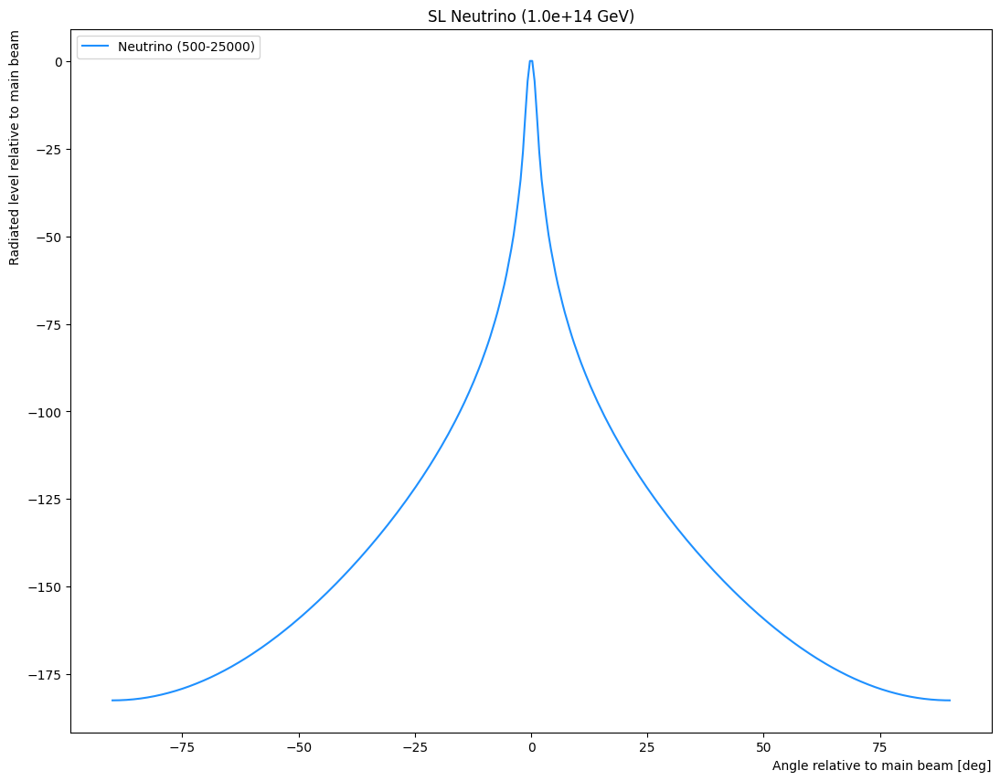

<Figure size 640x480 with 0 Axes>

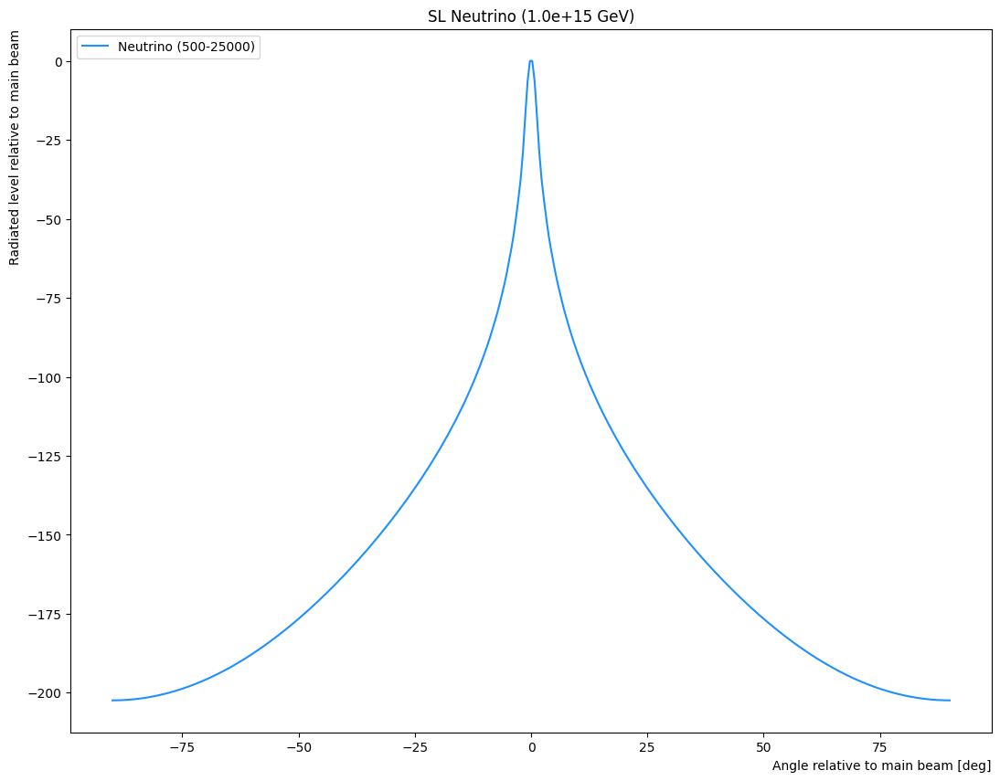

<Figure size 640x480 with 0 Axes>

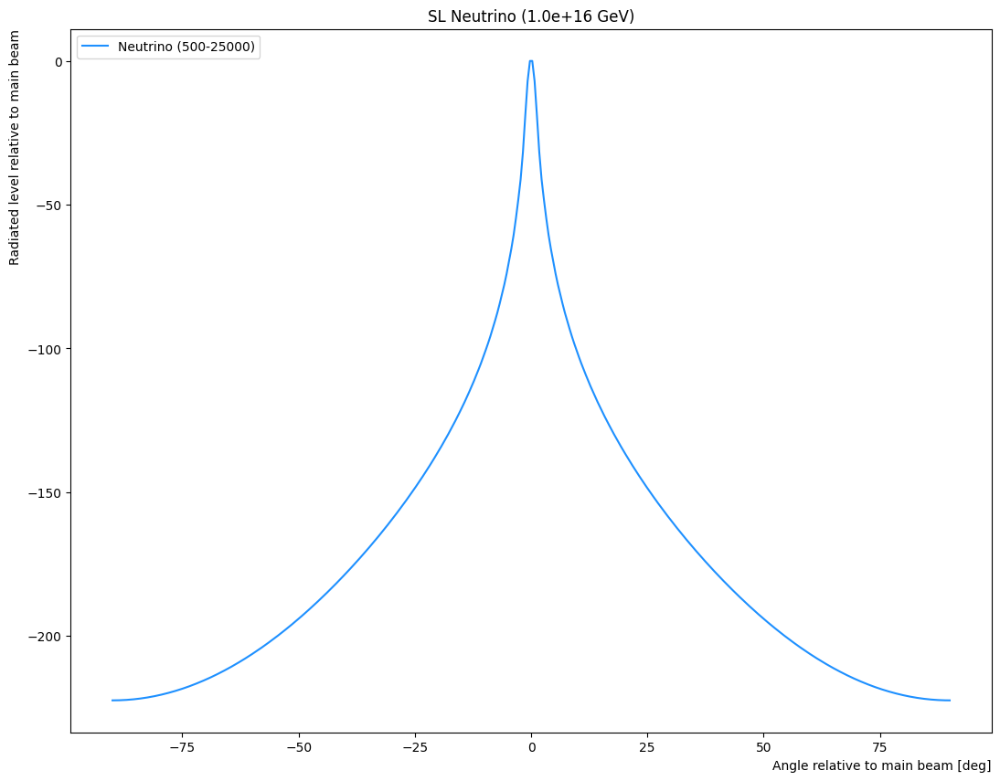

<Figure size 640x480 with 0 Axes>

In [6]:
def sound_level_Neutrino():
    """
    Generates the sound level (SL) distribution over angle for a neutrino
    """
    ###########################################################################################################################
    # set up the conditions to calculate sound level for the sperm whale and neutrino 
    ###########################################################################################################################        
    # angle w.r.t. axis of click [rad]
    thetas = np.linspace(-90, 90, 360)
    SL_thetas = []

    ###########################################################################################################################
    # Calculate the sound level for the neutrino in a similar manner
    ########################################################################################################################### 
    
    # Generate an array of frequencies from 5000 to 50000
    f_arr = np.linspace(500, 25000, 100) # 500 - 25000
    #f_arr = freqs[1:]
    #f_arr = np.linspace(freqs[1], freqs[len(freqs) - 1], 100)
    I_theta = np.zeros(len(thetas))

    # Loop over the frequencies and calculate the intensity of the neutrino at different angles
    for freq in f_arr:
        I_theta += np.asarray(list(map(correct_offaxis_neutrino, np.radians(thetas), [freq]*len(thetas))))

    # calculate the average intensity of the signal over different frequencies
    I_theta_mean = np.asarray(I_theta) / len(f_arr)
    
    # get the sound level relative to the original neutrino sound in log scale
    SL_thetas = [10*math.log10(x) for x in I_theta_mean]
    
    # from all the values in the list substract the maximum values such that all identities are negative and 0 is the maximum
    SL_thetas -= np.max(SL_thetas)      
    
    return SL_thetas, I_theta

def correct_offaxis_neutrino(theta, freq):
    # distance from the source to the detector, assumed to be 1 unit
    d = 2
    
    c_s = 1497
    
    # wavelength of the underwater signal which is speed of sound divided by the frequency
    wl = c_s/freq
    
    # initial intensity of the signal (assumed to be 1 unit)
    I_0 = 1
    
    # below the formula to find the intensity of a signal under different angles is used
    if theta == 0:
        return I_0
    else:
        return I_0 * pow(np.sin((np.pi*d/wl)*np.sin(theta))/((np.pi*d/wl)*np.sin(theta)), 2)


# extract the sound level values from the function
SL_Neutrino, I_theta = sound_level_Neutrino()

# use the same thetas as above
thetas = np.linspace(-90, 90, 360)

beampatterns = []

for i in range(0, len(dB_energies)):
    dB = dB_energies[i]
    # normalise the values of the sound level and use this normalisation to get an accurate SL_array
    SL_Neutrino_normalised = (SL_Neutrino - min(SL_Neutrino)) / (max(SL_Neutrino - min(SL_Neutrino)))
    SL_Neutrino_prepped = (SL_Neutrino_normalised * dB) - np.max(dB)
    
    # plot the absolute graph
    plt.figure(figsize=(13, 10))
    plt.title(f'SL Neutrino ({neutrino_energy[i]:.1e} GeV)')
    plt.plot(thetas, SL_Neutrino_prepped, '-', label = 'Neutrino (500-25000)', color= 'dodgerblue')
    #plt.plot(thetas, SL_Neutrino_sharp, '-', label = 'Neutrino (freqs)', color= 'gold')
    plt.legend(loc=2)
    plt.xlabel("Angle relative to main beam [deg]", ha ='right', x=1.0)
    plt.ylabel("Radiated level relative to main beam",   ha ='right', position=(0,1))
    
    plt.show()
    plt.clf()
    
    # beam pattern
    beampattern = np.column_stack((thetas[1:-1], SL_Neutrino_prepped[1:-1]))
    beampatterns.append(beampattern)

# Sound Speed Profile of Tanganyika 

In [6]:
import arlpy.plot as plt

env = pm.create_env2d()

# include the sound speed profile of Tanganyika
ssp = [
    [   0, 1503.89725749], 
    [   5, 1503.53512228],
    [  27, 1503.40633872],
    [  45, 1501.17598527],
    [  63, 1497.95739375],
    [  91, 1496.57667752],
    [ 120, 1496.18094787],
    [ 144, 1496.13991023],
    [ 168, 1496.23668012],
    [ 187, 1496.33233254],
    [ 216, 1496.82067334],
    [ 250, 1497.30878916],
    [ 300, 1497.98142059],
    [ 350, 1498.79460352],
    [ 400, 1499.46622159], 
    [ 450, 1500.36382161],
    [ 625, 1503.19287932],
    [ 721, 1504.83479986], 
    [ 818, 1506.35078556],
    [ 867, 1507.14541936],
    [1500, 1517.77346984]]   

envs = []

for i in range(0, len(neutrino_energy)):
    # create the 2D environment with the beampattern as the input
    env = pm.create_env2d(frequency=freq, min_angle=-89, max_angle=89, depth=1500, tx_depth=1100, tx_directionality=beampatterns[i], rx_depth=[525, 1425, 1350, 1275, 1200, 1125, 1050, 975, 900, 825, 750, 675, 600], rx_range=70000, soundspeed=ssp, nbeams=10000)
    envs.append(env)

# plot the sound speed profile
pm.plot_ssp(envs[1], width=500)
pm.print_env(envs[1])

                name : arlpy
   bottom_absorption : 0.1
      bottom_density : 1600
    bottom_roughness : 0
   bottom_soundspeed : 1600
               depth : 1500
        depth_interp : linear
           frequency : 20000
           max_angle : 89
           min_angle : -89
              nbeams : 10000
            rx_depth : [ 525. 1425. 1350. 1275. 1200. 1125. 1050.  975.  900.  825.  750.  675.
                         600.]
            rx_range : 70000
          soundspeed : [[   0.         1503.89725749]
                        [   5.         1503.53512228]
                        [  27.         1503.40633872]
                        [  45.         1501.17598527]
                        [  63.         1497.95739375]
                        [  91.         1496.57667752]
                        [ 120.         1496.18094787]
                        [ 144.         1496.13991023]
                        [ 168.         1496.23668012]
                        [ 187.         1496.33233254

In [7]:
pm.models()

['bellhop']

# Plotting an Environment

In [8]:
# Plotting an Environment using ARLPY
pm.plot_env(envs[1], surface_color='dodgerblue', bottom_color='peru', rx_color='blue', rx_plot=None, width=900)

# Calculate Transmission Loss

In [30]:
datas = []
tloss_coherent_array = []

for i in range(0, len(envs)):
    env = envs[i]
    # decide the distance to plot it over
    env['rx_range'] = np.linspace(0, 30000, 1001)    # 30 km
    env['rx_depth'] = np.linspace(0, 1500, 1001)     # 1.5 km
    
    # compute the transmission loss
    tloss_coherent = pm.compute_transmission_loss(env, mode='coherent')
    tloss_coherent_array.append(tloss_coherent)
    epsilon = 1e-10
    print(dB_energies[i])
    data = 20 * np.log10(epsilon + np.abs(np.flipud(np.array(tloss_coherent)))) + dB_energies[i]
    datas.append(data)

        0.000000  0.000000  0.000000  2.968750  0.000000  3.218750  0.000000  \
0.0     0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
1.5     0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
3.0     0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
4.5     0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
6.0     0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
...          ...       ...       ...       ...       ...       ...       ...   
1494.0  0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
1495.5  0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
1497.0  0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
1498.5  0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   
1500.0  0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j -0.0+0.0j   

        3.351562  0.000000  3.468750  .

# Plot Transmission Loss ARLPY

In [23]:
import arlpy.plot as plt

def plot_transmission_loss(tloss, maximum, clim, env=None, **kwargs):
    """
    Plots transmission loss.

    :param tloss: complex transmission loss
    :param env: environment definition
    :param epsilon: small constant to avoid log(0)
    
    If environment definition is provided, it is overlayed over this plot using default
    parameters for `arlpy.uwapm.plot_env()`.

    Other keyword arguments applicable for `arlpy.plot.image()` are also supported.
    """
    epsilon = 1e-10
    
    # Determine range and depth
    tloss.columns = (tloss.columns / max(tloss.columns)) * maximum
    xr = (min(tloss.columns), max(tloss.columns))
    yr = (-max(tloss.index), -min(tloss.index))

    # Adjust x-axis label for range magnitude
    xlabel = 'Range (m)'
    if xr[1] - xr[0] > 10000:
        xr = (min(tloss.columns) / 1000, max(tloss.columns) / 1000)
        xlabel = 'Range (km)'

    # Hold the plot
    oh = plt.hold()

    # Plot transmission loss as image
    plt.image(20 * np.log10(epsilon + np.abs(np.flipud(np.array(tloss)))),
              x=xr,
              y=yr,
              xlabel=xlabel,
              ylabel='Depth (m)',
              xlim=xr,
              ylim=yr,
              clim=clim,
              colormap='Viridis256',
              **kwargs)

    # Overlay environment definition if provided
    if env is not None:
        pm.plot_env(env, rx_plot=False)

    # Release the plot
    plt.hold(oh)

In [32]:
plot_transmission_loss(tloss_coherent_array[2], np.max(env['rx_range']), [-dB_energies[2]+dB_threshold, 0], width=900)

In [12]:
env = pm.create_env2d(frequency=freq, min_angle=-89, max_angle=89, depth=1500, tx_depth=1100, tx_directionality=beampatterns[4], rx_depth=800, rx_range=20000, soundspeed=ssp, nbeams=10000)

arrivals = pm.compute_arrivals(env)

pm.plot_arrivals(arrivals, dB=True)

# Plot Transmission Loss MATPLOTLIB

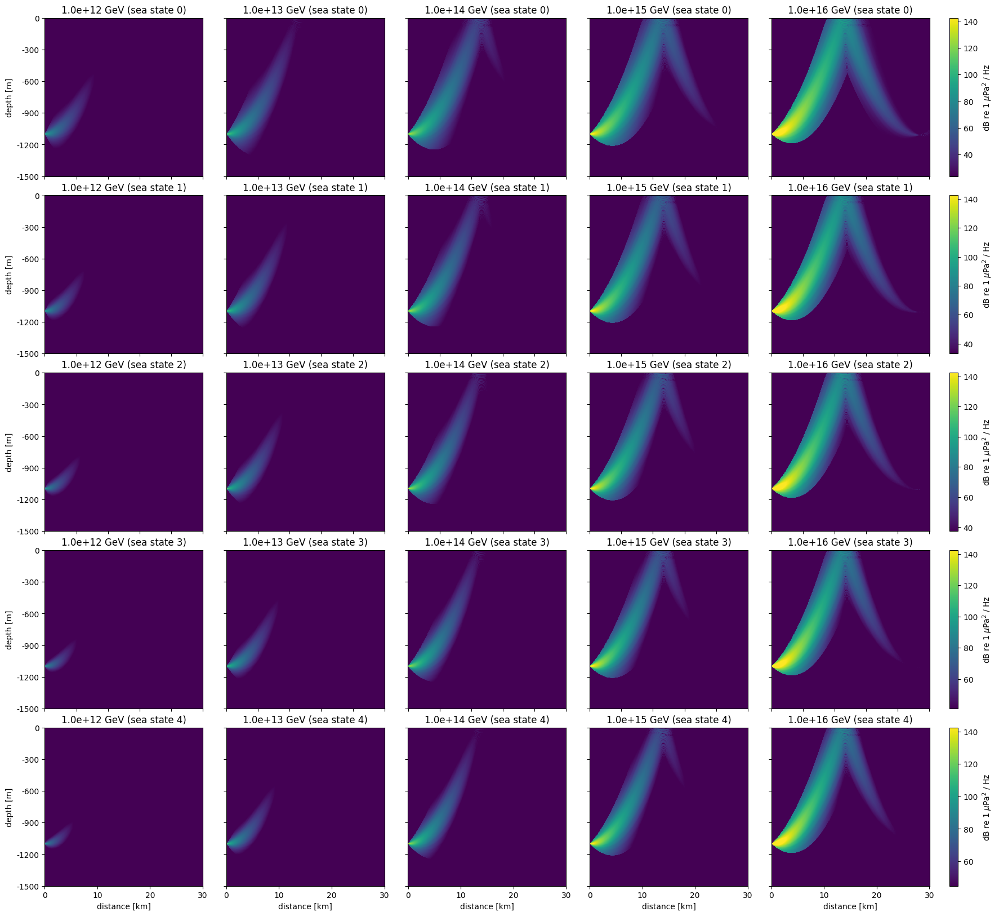

In [13]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# Assuming datas, noise, dB_energies, and neutrino_energy are already defined

fig = plt.figure(figsize=(21, 20))  # Adjust the figure size as needed

# Create a GridSpec layout: 5 rows and 6 columns, with the last column for colorbars
gs = gridspec.GridSpec(5, 6, width_ratios=[1, 1, 1, 1, 1, 0.05], wspace=0.12, hspace=0.12)

# Loop over rows and columns
for i in range(5): 
    for j in range(5):  
        ax = plt.subplot(gs[i, j])
        
        # Generate or get your data for each subplot here
        data = datas[j]  # Example, replace with appropriate indexing or method to get your specific plot data

        # Adjust clim to use the appropriate values for noise level and dB energy
        im = ax.imshow(data, cmap='viridis', interpolation='nearest', clim=[noise[i], dB_energies[0]], origin='lower')
        
        # Only set x-axis labels for the bottom row plots
        if i == 4:  # Adjust this index based on your number of rows
            ax.set_xlabel('distance [km]')
            ax.set_xticks([0, 333, 666, 1000])
            ax.set_xticklabels(['0', '10', '20', '30'])
        else:
            ax.tick_params(labelbottom=False)  # Hide x-axis labels for other rows
            
        # Only set y-axis labels for the leftmost column plots
        if j == 0:
            ax.set_ylabel('depth [m]')
            ax.set_yticks([0, 200, 400, 600, 800, 1000])
            ax.set_yticklabels(['-1500', '-1200', '-900', '-600', '-300', '0'])
        else:
            ax.tick_params(labelleft=False)  # Hide y-axis labels for other columns
        
        ax.set_title(f'{neutrino_energy[j]:.1e} GeV (sea state {i})')

    # Add colorbar in the last column for each row
    cbar_ax = plt.subplot(gs[i, -1])
    fig.colorbar(im, cax=cbar_ax)
    cbar_ax.set_ylabel('dB re 1 $\mu$Pa$^2$ / Hz')

plt.savefig('Transmission Loss with noise.png')
plt.show()   

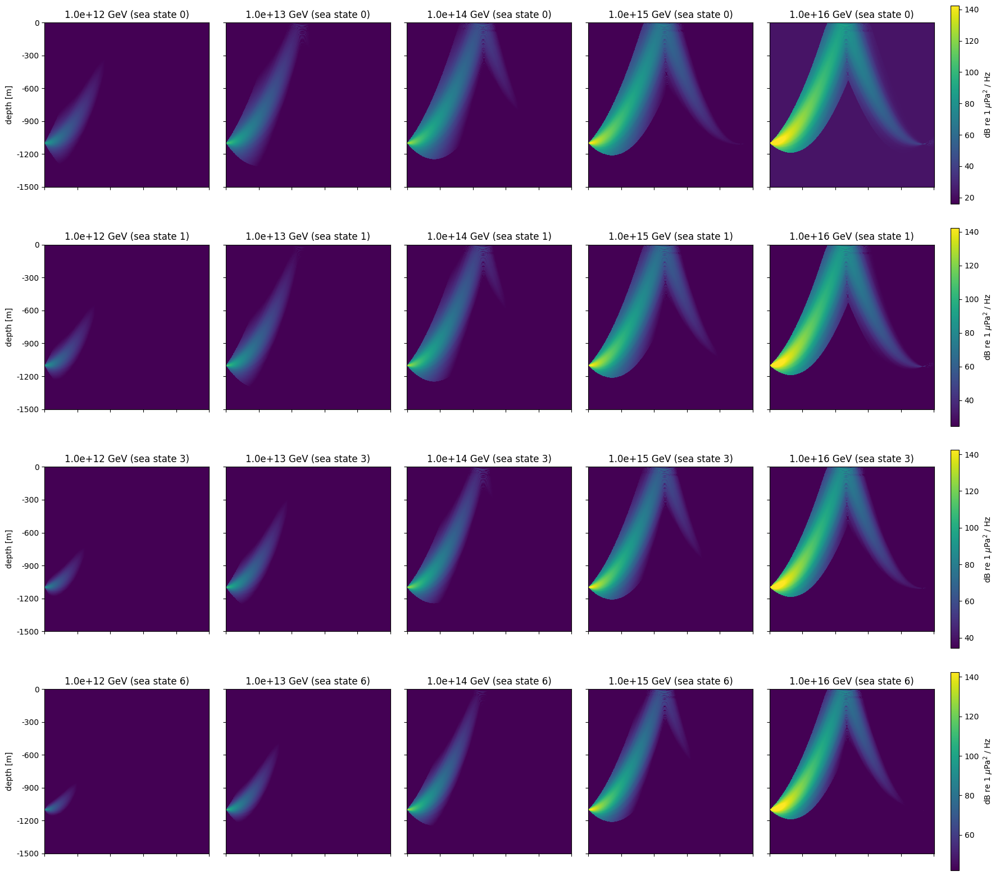

In [14]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# Assuming datas, noise, dB_energies, and neutrino_energy are already defined

fig = plt.figure(figsize=(21, 20))  # Adjust the figure size as needed

# Create a GridSpec layout: 5 rows and 6 columns, with the last column for colorbars
gs = gridspec.GridSpec(4, 6, width_ratios=[1, 1, 1, 1, 1, 0.05], wspace=0.12, hspace=0.12)

label_seastate = ['0', '1', '3', '6']

# Loop over rows and columns
for i in range(4): 
    for j in range(5):  
        ax = plt.subplot(gs[i, j])
        
        # Generate or get your data for each subplot here
        data = datas[j]  # Example, replace with appropriate indexing or method to get your specific plot data

        # Adjust clim to use the appropriate values for noise level and dB energy
        im = ax.imshow(data, cmap='viridis', interpolation='nearest', clim=[noise1[i], dB_energies[0]], origin='lower')
        
        # Only set x-axis labels for the bottom row plots
        if i == 4:  # Adjust this index based on your number of rows
            ax.set_xlabel('distance [km]')
            ax.set_xticks([0, 333, 666, 1000])
            ax.set_xticklabels(['0', '10', '20', '30'])
        else:
            ax.tick_params(labelbottom=False)  # Hide x-axis labels for other rows
            
        # Only set y-axis labels for the leftmost column plots
        if j == 0:
            ax.set_ylabel('depth [m]')
            ax.set_yticks([0, 200, 400, 600, 800, 1000])
            ax.set_yticklabels(['-1500', '-1200', '-900', '-600', '-300', '0'])
        else:
            ax.tick_params(labelleft=False)  # Hide y-axis labels for other columns
        
        ax.set_title(f'{neutrino_energy[j]:.1e} GeV (sea state {label_seastate[i]})')

    # Add colorbar in the last column for each row
    cbar_ax = plt.subplot(gs[i, -1])
    fig.colorbar(im, cax=cbar_ax)
    cbar_ax.set_ylabel('dB re 1 $\mu$Pa$^2$ / Hz')

plt.savefig('Transmission Loss with noise1.png')
plt.show()   

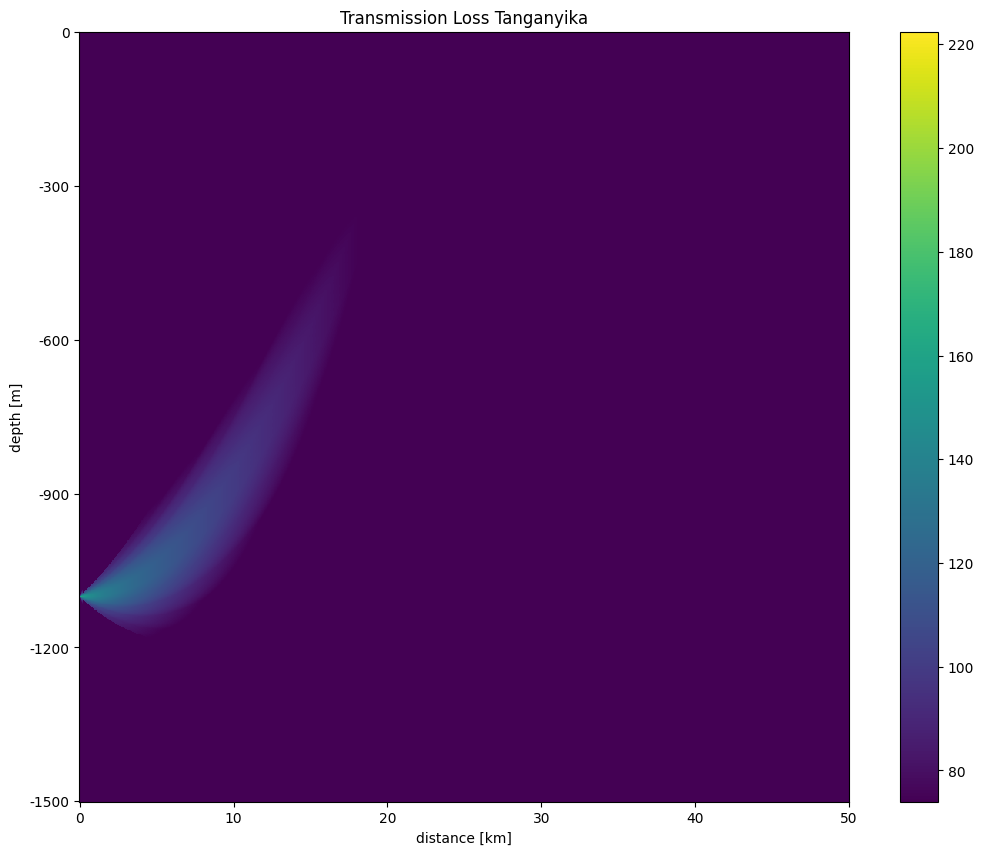

In [15]:
epsilon = 1e-10
data = 20 * np.log10(epsilon + np.abs(np.flipud(np.array(tloss_coherent)))) - np.min(20 * np.log10(epsilon + np.abs(np.flipud(np.array(tloss_coherent)))))

# Create the plot
pixel_plot = plt.figure(figsize=(13, 10)) 

# Plot the data with specified extent
plt.title("Transmission Loss Tanganyika") 
pixel_plot = plt.imshow(data, cmap='viridis', interpolation='nearest', clim=[dB_threshold, dB], origin='lower') 

plt.xlabel('distance [km]')
plt.ylabel('depth [m]')

# Set custom labels for x-axis
plt.xticks([0, 200, 400, 600, 800, 1000], ['0', '10', '20', '30', '40', '50'])

# Set custom labels for y-axis
plt.yticks([0, 200, 400, 600, 800, 1000], ['-1500', '-1200', '-900', '-600', '-300', '0'])

plt.colorbar(pixel_plot)  
  
# Show plot
plt.show(pixel_plot)

In [16]:
# plot the transmission losses
plot_transmission_loss(tloss_coherent, np.max(env['rx_range']), [(dB_threshold - dB), 0], width=900)
plot_transmission_loss(tloss_incoherent, np.max(env['rx_range']), [(dB_threshold - dB), 0], width=900)

AttributeError: module 'matplotlib.pyplot' has no attribute 'hold'

In [ ]:
def plot_rays(rays, env=None, invert_colors=False, **kwargs):
    """Plots ray paths.

    :param rays: ray paths
    :param env: environment definition
    :param invert_colors: False to use black for high intensity rays, True to use white

    If environment definition is provided, it is overlayed over this plot using default
    parameters for `arlpy.uwapm.plot_env()`.

    Other keyword arguments applicable for `arlpy.plot.plot()` are also supported.

    >>> import arlpy.uwapm as pm
    >>> env = pm.create_env2d()
    >>> rays = pm.compute_eigenrays(env)
    >>> pm.plot_rays(rays, width=1000)
    """
    rays = rays.sort_values('bottom_bounces', ascending=False)
    max_amp = np.max(np.abs(rays.bottom_bounces)) if len(rays.bottom_bounces) > 0 else 0
    if max_amp <= 0:
        max_amp = 1
    divisor = 1
    xlabel = 'Range (m)'
    r = []
    for _, row in rays.iterrows():
        r += list(row.ray[:,0])
    if max(r)-min(r) > 10000:
        divisor = 1000
        xlabel = 'Range (km)'
    oh = plt.hold()
    for _, row in rays.iterrows():
        c = int(255*np.abs(row.bottom_bounces)/max_amp)
        if invert_colors:
            c = 255-c
        c = bokeh.colors.RGB(c, c, c)
        plt.plot(row.ray[:,0]/divisor, -row.ray[:,1], color=c, xlabel=xlabel, ylabel='Depth (m)', **kwargs)
    if env is not None:
        plot_env(env)
    plt.hold(oh)

In [ ]:
rays = pm.compute_rays(env)

In [ ]:
plot_rays(rays)

- **Eigenray** plots show just the rays that connect the source to a receiver.

In [ ]:
# Eigenrays using ARLPY
rays = pm.compute_eigenrays(env)
print(rays)
pm.plot_rays(rays, env=env, width=900)

In [ ]:
rays = pm.compute_rays(env)
constant_rays = pm.compute_rays(constant_env)

pm.plot_rays(rays, env=env, width=900)
pm.plot_rays(constant_rays, env=constant_env, width=900)

In [ ]:
depth = [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300]


for i in range(0, len(depth)):
    tx = depth[i]
    env = pm.create_env2d(frequency=10000, min_angle=-5, max_angle=5, depth=1500, tx_depth=tx, rx_depth=[525, 1425, 1350, 1275, 1200, 1125, 1050, 975, 900, 825, 750, 675, 600], rx_range=48000, soundspeed=ssp)
    rays = pm.compute_rays(env)
    pm.plot_rays(rays, env=env, width=900)
    arrivals = pm.compute_arrivals(env)
    pm.plot_arrivals(arrivals, width=900)

In [ ]:
env = pm.create_env2d(frequency=10000, min_angle=-5, max_angle=5, depth=1500, tx_depth=150, rx_depth=[525, 1425, 1350, 1275, 1200, 1125, 1050, 975, 900, 825, 750, 675, 600], rx_range=48000, soundspeed=ssp)

# compute the arrival structure at the receiver
arrivals = pm.compute_arrivals(env)
pm.plot_arrivals(arrivals, width=900)

In [ ]:
# convert to a impulse response time series
ir = pm.arrivals_to_impulse_response(arrivals, fs=96000)
plt.plot(np.abs(ir), fs=96000, width=900)

If you want the received signal strength (RSS) to be in the same units as the original signal strength, in this case, millipascal (mPa), you would need to convert the dB result back to the linear scale of the original units. The formula for this conversion is:

$$ RSS \: [mPa] = 10^{(\frac{RSS \: [dB]}{20})} $$

In [ ]:
# We can see in the plots below that the signal strength reduces with about -120 dB
RSS = 10**(-140 / 20)

print(RSS)

minimum_value = (1 / RSS) * 5
print(f"for a neutrino being created 48 kilometers away, the minimum energy detectable can be {minimum_value} mPa.")



#signal of 10**4 mPa, how far?
original_energy = 10**3

minimum_value = 5 
RSS = minimum_value / original_energy
print(RSS)

reduce = np.log(RSS) * 20

print(reduce)





In [ ]:
env['rx_range'] = np.linspace(0, 35000, 1001)
env['rx_depth'] = np.linspace(0, 1500, 1001)

In [ ]:
tloss = pm.compute_transmission_loss(env, mode='incoherent')

pm.plot_transmission_loss(tloss, env=env, clim=[-100,-40])

In [ ]:
constant_tloss = pm.compute_transmission_loss(constant_env, mode='incoherent')

pm.plot_transmission_loss(constant_tloss, env=constant_env, clim=[-100,-10])

In [ ]:
pm.plot_transmission_loss(constant_tloss, env=constant_env, clim=[-100,-10])

In [ ]:
constant_tloss = pm.compute_transmission_loss(constant_env, mode='coherent')

pm.plot_transmission_loss(constant_tloss, env=constant_env, clim=[-100,-10])

In [ ]:
constant_env = pm.create_env2d(frequency=10000, min_angle=-89, max_angle=89, depth=1500, tx_depth=900, rx_depth=[525, 1425, 1350, 1275, 1200, 1125, 1050, 975, 900, 825, 750, 675, 600], rx_range=70000, soundspeed=ssp)
constant_env['rx_range'] = np.linspace(0, 35000, 1001)
constant_env['rx_depth'] = np.linspace(0, 1500, 1001)

constant_tloss_tx = pm.compute_transmission_loss(constant_env, mode='incoherent')

pm.plot_transmission_loss(constant_tloss_tx, env=constant_env, clim=[-100,-10], width=900)

In [ ]:
env = pm.create_env2d(frequency=10000, min_angle=-89, max_angle=89, depth=1500, tx_depth=900, tx_directionality=beampattern, rx_depth=[525, 1425, 1350, 1275, 1200, 1125, 1050, 975, 900, 825, 750, 675, 600], rx_range=70000, soundspeed=ssp)
env['rx_range'] = np.linspace(0, 35000, 1001)
env['rx_depth'] = np.linspace(0, 1500, 1001)

tloss_tx = pm.compute_transmission_loss(env, mode='incoherent')

pm.plot_transmission_loss(tloss_tx, env=env, clim=[-100,-10], width=900)

In [ ]:
pm.plot_transmission_loss(constant_tloss_tx, env=constant_env, clim=[-150,-10], width=900)
pm.plot_transmission_loss(tloss_tx, env=env, clim=[-150,-10], width=900)

In [ ]:
pm.plot_transmission_loss(tloss, env=env, clim=[-130,-10], width=900)
pm.plot_transmission_loss(constant_tloss, env=constant_env, clim=[-130,-10], width=900)

In [ ]:
pm.plot_transmission_loss(tloss2, env=env, clim=[-150,-1], width=900)

# Bathymetry

Let's first start off by defining our bathymetry, a steep up-slope for the first 300 m, and then a gentle downslope:

In [ ]:
# add/change bathy to env
bathy = [
    [0, 30],    # 30 m water depth at the transmitter
    [300, 20],  # 20 m water depth 300 m away
    [1000, 25]  # 25 m water depth at 1 km
]

# add/change SSP to env
ssp = [
    [ 0, 1540],  # 1540 m/s at the surface
    [10, 1530],  # 1530 m/s at 10 m depth
    [20, 1532],  # 1532 m/s at 20 m depth
    [25, 1533],  # 1533 m/s at 25 m depth
    [30, 1535]   # 1535 m/s at the seabed
]

# Appending ssp and bathy to existing env file
env = pm.create_env2d(
    depth=bathy,
    soundspeed=ssp,
    bottom_soundspeed=1450,
    bottom_density=1200,
    bottom_absorption=1.0,
    tx_depth=15
)
pm.print_env(env)

In [ ]:
pm.plot_env(env, width=900)

Looks more interesting! Let's see what the eigenrays look like, and also the arrival structure:

In [ ]:
rays = pm.compute_eigenrays(env)
pm.plot_rays(rays, env=env, width=900)

We could also ignore the receiver, and plot rays launched at various angles:

In [ ]:
rays = pm.compute_rays(env)
pm.plot_rays(rays, env=env, width=900)

# Complex Bathymetry Example

In [ ]:
import numpy as np
from scipy.interpolate import griddata
import scipy.ndimage as ndimage
from scipy.ndimage import gaussian_filter
import scipy
# from scipy.misc import imsave
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from stl import mesh, Mode
import matplotlib.tri as mtri
from mpl_toolkits.mplot3d.axes3d import get_test_data
from pandas import read_csv



data = read_csv('bathy.txt', sep='\s+', header=None, names=['x', 'y', 'depth'])

x = np.arange(data.x.min(), data.x.max()+1)
y = np.arange(data.y.min(), data.y.max()+1)

X, Y = np.meshgrid(x, y)

Z = griddata(data[['x','y']].values, -data['depth'].values, (X, Y), method='linear')

# make the grid square
Z[np.isnan(Z)] = 0

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111)
plt.imshow(Z)
plt.show()

<h3>       Figure 3: Bedford Basin Bathy 2D </h3>

<h3>       Figure 4: Bedford Basin Bathy 3D </h3>

or place lots of receivers in a grid to visualize the acoustic pressure field (or equivalently transmission loss). We can modify the environment (env) without having to recreate it, as it is simply a Python dictionary object:

In [ ]:
env['rx_range'] = np.linspace(0, 1000, 1001)
env['rx_depth'] = np.linspace(0, 30, 301)

# Transmission Loss

In [ ]:
- RUN TYPE BELLHOP

OPTION(1:1):           'R' generates a ray file
                       'E' generates an eigenray file
                       'A' generates an amplitude-delay file (ascii)
                       'a' generate  an amplitude-delay file (binary)
                       'C' Coherent     TL calculation
                       'I  Incoherent   TL calculation
                       'S' Semicoherent TL calculation
                            (Lloyd mirror source pattern)
                        
- The number of beams, NBeams, should normally be set to 0, allowing BELLHOP to automatically select the appropriate value. The number
needed increases with frequency and the maximum range to a receiver. 

- The pressure field, p, is then calculated for the specified grid of receivers, with a scaling such that $20\ log10(|p|)$ is the transmission loss in dB.

In [ ]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

We see a complicated interference pattern, but an interesting focusing at 800 m at a 15 m depth. The detailed interference pattern is of course sensitive to small changes in the environment. A less sensitive, but more averaged out, transmission loss estimate can be obtained using the incoherent mode:

In [ ]:
tloss = pm.compute_transmission_loss(env, mode='incoherent')
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

# Source directionality

Now, let's use a directional transmitter instead of an omni-directional one:

In [ ]:
beampattern = np.array([
    [-180,  10], [-170, -10], [-160,   0], [-150, -20], [-140, -10], [-130, -30],
    [-120, -20], [-110, -40], [-100, -30], [-90 , -50], [-80 , -30], [-70 , -40],
    [-60 , -20], [-50 , -30], [-40 , -10], [-30 , -20], [-20 ,   0], [-10 , -10],
    [  0 ,  10], [ 10 , -10], [ 20 ,   0], [ 30 , -20], [ 40 , -10], [ 50 , -30],
    [ 60 , -20], [ 70 , -40], [ 80 , -30], [ 90 , -50], [100 , -30], [110 , -40],
    [120 , -20], [130 , -30], [140 , -10], [150 , -20], [160 ,   0], [170 , -10],
    [180 ,  10]
])
env['tx_directionality'] = beampattern

In [ ]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

Now you can see the directionality and the sidelobe structure of the transmitter.

In [ ]:
tloss = pm.compute_transmission_loss(env, mode='incoherent')
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

# Undulating water surface

Finally, let's try adding a long wavelength swell on the water surface:

In [ ]:
surface = np.array([[r, 0.5+0.5*np.sin(2*np.pi*0.005*r)] for r in np.linspace(0,1000,1001)])
env['surface'] = surface

In [ ]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

![ar13](ar-13.png "ar-13")

In [ ]:
tloss = pm.compute_transmission_loss(env, mode='incoherent')
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

![ar14](ar-14.png "ar-14")

Now, if I placed a receiver at 800 m, and 15 m depth, roughly where we see some focusing, what would the eigenrays and arrival structure look like?

In [ ]:
Now, if I placed a receiver at 800 m, and 15 m depth, roughly where we see some focusing, what would the eigenrays and arrival structure look like

In [ ]:
env['rx_range'] = 800
env['rx_depth'] = 15

In [ ]:
rays = pm.compute_eigenrays(env)
pm.plot_rays(rays, env=env, width=900)

![ar15](ar-15.png "ar-15")

In [ ]:
arrivals = pm.compute_arrivals(env)
pm.plot_arrivals(arrivals, dB=True, width=900)

![ar16](ar-16.png "ar-16")

**Note:** We plotted the amplitudes in dB, as the later arrivals are much weaker than the first one, and better visualized in a logarithmic scale.

# Bellhop3D

- **BELLHOP3D** is a beam tracing model for predicting acoustic pressure fields in ocean environments. 
- It is an extension to 3D environments of the popular BELLHOP model and includes (optionally) horizontal refraction in the lat-long plane.
- 3D pressure fields can be calculated by a 2D model simply by running it on a series of radials (bearing lines) from the source.(This is the so-called Nx2D or 2.5D approach.)

- **BELLHOP3D** includes 4 different types of beams:
    - Cerveny Beams,
    - Geometric Hat-Beams,
    - Geometric Gaussian-Beams,
    - Geometric Hat-Beams in Cartesian Coordinates

### P.S. : Not Supported right now on the python, still works great on MATLAB. 

In [ ]:
------------------------------------------------------------------------------------------------------------------------------

# Another simulation case :

Start off with checking that everything is working correctly:

In [ ]:
# Author : Jay Patel, Dalhousie University
# ECED 6575
import arlpy.uwapm as pm
import arlpy.plot as plt
import numpy as np
import pandas as pd

In [ ]:
pm.models()

In [ ]:
# We next create an underwater 2D environment (with default settings) to model:

env = pm.create_env2d()
pm.print_env(env)

In [ ]:
# =============================================================================
# Sound speed profile
# =============================================================================
# ssp = 1500

# Depth dependent sound speed as an array
ssp = [
    [0, 1540.4],   # Speed at the surface
    [10, 1540.5],
    [20, 1540.7],
    [30, 1534.4],
    [50, 1523.3],
    [75, 1519.6],
    [100, 1518.5]  # Speed at the seabed
]

In [ ]:
depth = 100

In [ ]:
# Bottom properties
bottom_absorption = 1.0
bottom_density = 1200

In [ ]:
# =============================================================================
# Surface parameters
# =============================================================================
surface = None

# Surface profile
# surface = np.array([[r, 0.5+0.5*np.sin(2*np.pi*0.005*r)]
#                     for r in np.linspace(0, scenario.rx_range, 1+scenario.rx_range)])

In [ ]:
# =============================================================================
# Ambient noise
# =============================================================================
sea_state = 3

# Ambient noise table
# TODO: Convert to lookup table based on sea_state and scenario.tx_frequency
an = pd.DataFrame({
        1: [34],                # profile at SS1
        2: [39],                # profile at SS2
        3: [47],                # profile at SS3
        4: [50],                # profile at SS4
        5: [52],                # profile at SS5
        6: [54]},               # profile at SS6
        index=[20000])          # frequency of profiles in Hz

In [ ]:
# =============================================================================
# TX properties
# =============================================================================
# tx_beampattern = np.array([
#     [-180,  10], [-170, -10], [-160,   0], [-150, -20], [-140, -10], [-130, -30],
#     [-120, -20], [-110, -40], [-100, -30], [-90 , -50], [-80 , -30], [-70 , -40],
#     [-60 , -20], [-50 , -30], [-40 , -10], [-30 , -20], [-20 ,   0], [-10 , -10],
#     [  0 ,  10], [ 10 , -10], [ 20 ,   0], [ 30 , -20], [ 40 , -10], [ 50 , -30],
#     [ 60 , -20], [ 70 , -40], [ 80 , -30], [ 90 , -50], [100 , -30], [110 , -40],
#     [120 , -20], [130 , -30], [140 , -10], [150 , -20], [160 ,   0], [170 , -10],
#     [180 ,  10]
# ])
tx_beampattern = None
tx_depth = 50           # m
tx_frequency = 20000    # Hz
tx_source_level = 150   # dB
tx_speed_range = 20     # knots

In [ ]:
# =============================================================================
# RX properties
# =============================================================================
rx_bandwidth = 10           # Hz
rx_depth = 15               # m
rx_detection_threshold = 5  # dB
rx_directivity_index = 10   # dB
rx_range = 2000             # m


In [ ]:
env = pm.create_env2d(
        bottom_absorption=bottom_absorption,
        bottom_density=bottom_density,
        depth=depth,
        soundspeed=ssp,
        surface=surface,
        rx_depth=rx_depth,
        rx_range=rx_range,
        tx_depth=tx_depth,
        tx_directionality=tx_beampattern
    )

In [ ]:
pm.print_env(env)

In [ ]:
pm.plot_env(env, width=900)

![ar17](ar-17.png "ar-17")

In [ ]:
pm.plot_ssp(env, width=900)

![ar18](ar-18.png "ar-18")

In [ ]:
rays = pm.compute_eigenrays(env)
pm.plot_rays(rays, env=env, width=900)

![ar19](ar-19.png "ar-19")

In [ ]:
rays = pm.compute_rays(env , debug=False)
pm.plot_rays(rays, env=env, width=900)

![ar20](ar-20.png "ar-20")

In [ ]:
arrivals = pm.compute_arrivals(env)
pm.plot_arrivals(arrivals, width=900)

![ar21](ar-21.png "ar-21")

In [ ]:
arrivals[arrivals.arrival_number < 10][['time_of_arrival', 'angle_of_arrival', 'surface_bounces', 'bottom_bounces']]

In [ ]:
ir = pm.arrivals_to_impulse_response(arrivals, fs=96000)
plt.plot(np.abs(ir), fs=96000, width=900)

![ar22](ar-22.png "ar-22")

In [ ]:
env['rx_range'] = np.linspace(0, 2000, 1001)
env['rx_depth'] = np.linspace(0, 15, 301)

In [ ]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

![ar23](ar-23.png "ar-23")

# More complex environments

In [ ]:
env['rx_range'] = np.linspace(0, 2000, 1001)
env['rx_depth'] = np.linspace(0, 15, 301)

In [ ]:
beampattern = np.array([
    [-180,  10], [-170, -10], [-160,   0], [-150, -20], [-140, -10], [-130, -30],
    [-120, -20], [-110, -40], [-100, -30], [-90 , -50], [-80 , -30], [-70 , -40],
    [-60 , -20], [-50 , -30], [-40 , -10], [-30 , -20], [-20 ,   0], [-10 , -10],
    [  0 ,  10], [ 10 , -10], [ 20 ,   0], [ 30 , -20], [ 40 , -10], [ 50 , -30],
    [ 60 , -20], [ 70 , -40], [ 80 , -30], [ 90 , -50], [100 , -30], [110 , -40],
    [120 , -20], [130 , -30], [140 , -10], [150 , -20], [160 ,   0], [170 , -10],
    [180 ,  10]
])
env['tx_directionality'] = beampattern

In [ ]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

![ar24](ar-24.png "ar-24")

Now you can see the directionality and the sidelobe structure of the transmitter.

### Undulating water surface

Finally, let's try adding a long wavelength swell on the water surface:

In [ ]:
surface = np.array([[r, 0.5+0.5*np.sin(2*np.pi*0.005*r)] for r in np.linspace(0,2000,2001)])
env['surface'] = surface

In [ ]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

![ar25](ar-25.png "ar-25")

Now, if I placed a receiver at 655 m, and 8 m depth, roughly where we see some focusing, what would the eigenrays and arrival structure look like?

In [ ]:
env['rx_range'] = 655
env['rx_depth'] = 8

In [ ]:
rays = pm.compute_eigenrays(env)
pm.plot_rays(rays, env=env, width=900)

![ar26](ar-26.png "ar-26")

In [ ]:
arrivals = pm.compute_arrivals(env)
pm.plot_arrivals(arrivals, dB=True, width=900)

![ar27](ar-27.png "ar-27")

We plotted the amplitudes in dB, as the later arrivals are much weaker than the first one, and better visualized in a logarithmic scale.

# Generate Chirp Signal and check response of channel:

In [ ]:
from scipy import signal
import matplotlib.pyplot as mplt

In [ ]:
ir = pm.arrivals_to_impulse_response(arrivals, fs=96000, abs_time=True)

We'll create a chirp signal 10-20 kHz in 1/4 second and then send that signal through the channel:

In [ ]:
t = np.linspace(0,1//4,96000//4+1)
chirp = signal.chirp(t,10000,1/4,20000)
ch_resp = signal.fftconvolve(chirp, ir)

Spectrogram for 500m range channel:

In [ ]:
%matplotlib notebook

In [ ]:
env['rx_range'] = 655
arrivals = pm.compute_arrivals(env)
ir = pm.arrivals_to_impulse_response(arrivals, fs=96000, abs_time=True)
ch_resp = signal.fftconvolve(chirp, ir)
mplt.figure()
Pxx, freqs, bins, im = mplt.specgram(ch_resp, Fs=96000,sides='onesided')
mplt.ylabel('freq [Hz]')
mplt.xlabel('time [sec]')

![ar28](ar-28n.png "ar-28")

In [ ]:
# first 10 arrivals : compare the figures
pm.plot_arrivals(arrivals, dB=True, width=900)

![ar29](ar-29.png "ar-29")

Spectrogram for 2000m channel:

In [ ]:
env['rx_range'] = 2000
arrivals = pm.compute_arrivals(env)
ir = pm.arrivals_to_impulse_response(arrivals, fs=96000, abs_time=True)
mplt.figure()
ch_resp = signal.fftconvolve(chirp, ir)
Pxx, freqs, bins, im = mplt.specgram(ch_resp, Fs=96000, sides='onesided')
mplt.ylabel('freq [Hz]')
mplt.xlabel('time [sec]')

![ar30](ar-30.png "ar-30")

In [ ]:
# first 10 arrivals : compare the figures
pm.plot_arrivals(arrivals, dB=True, width=900)

![ar31](ar-31.png "ar-31")

In [ ]:
rays = pm.compute_rays(env , debug=True)

# Appendix

In [ ]:
This is bellhop *.env file example:

In [ ]:
'arlpy'                  / (Graph Title - just for Fortran/MATLAB)
25000.000000             / FREQUENCY
1                        / [UNUSED]
'SVWT*'                  / [(SSP INTERP METHOD)(TOP LAYER)(BOTTOM ATTENUATION UNITS)(VOLUME ATTENUATION)]
1 0.0 100.000000         / [UNUSED] [UNUSED] [MAX DEPTH]
  0.000000 1540.400000   / [DEPTH] [SOUND SPEED] 
  10.000000 1540.500000  / [DEPTH] [SOUND SPEED]
  20.000000 1540.700000  / [DEPTH] [SOUND SPEED]
  30.000000 1534.400000  / [DEPTH] [SOUND SPEED]
  50.000000 1523.300000  / [DEPTH] [SOUND SPEED]
  75.000000 1519.600000  / [DEPTH] [SOUND SPEED]
  100.000000 1518.500000 / [DEPTH] [SOUND SPEED]
'A' 0.000000             / [(BOTTOM LAYER)(EXTERNAL BATHYMETRY] [SIGMA BOTTOM ROUGHNESS]
100.000000 1600.000000 0.0 1.200000 1.000000 / [MAX DEPTH] [SOUND SPEED BOTTOM] [UNUSED] [DENSITY BOTTOM] [ATTENUATION BOTTOM]
1                        / [NUMBER SOURCES]
50.000000                / [SOURCE DEPTHS 1:N (m)]
1                        / [NUMBER RECEIVER DEPTHS]
8.000000                 / [RECEIVER DEPTHS 1:N (m)]
1                        / [NUMBER RECEIVER RANGES]
2.000000                 / [RECEIVER RANGES 1:N (km)]
'R *'                    / [(RUN TYPE)(BEAM TYPE)(EXTERNAL SOURCE BEAM PATTERN)] ; typically "R/C/I/S" - Refer next line
0                        / [NUMBER OF BEAMS] ; default is 0 that means bellhop calculates it by itself using 
-80.000000 80.000000     / [MIN ANGLE] [MAX ANGLE]
0.0 101.000000 2.020000  / [STEP SIZE] [DEPTH BOX] [RANGE BOX] ; default step size is 0.

In [ ]:
# Another Sample Input (Environmental) File:

'Munk profile'        ! TITLE
50.0                  ! FREQ (Hz)
1                     ! NMEDIA
'SVN'                 ! SSPOPT (Analytic or C-linear interpolation)
51  0.0  5000.0       ! DEPTH of bottom (m)
    0.0  1548.52  /
  200.0  1530.29  /
  250.0  1526.69  /
  400.0  1517.78  /
  600.0  1509.49  /
  800.0  1504.30  /
 1000.0  1501.38  /
 1200.0  1500.14  /
 1400.0  1500.12  /
 1600.0  1501.02  /
 1800.0  1502.57  /
 2000.0  1504.62  /
 2200.0  1507.02  /
 2400.0  1509.69  /
 2600.0  1512.55  /
 2800.0  1515.56  /
 3000.0  1518.67  /
 3200.0  1521.85  /
 3400.0  1525.10  /
 3600.0  1528.38  /
 3800.0  1531.70  /
 4000.0  1535.04  /
 4200.0  1538.39  /
 4400.0  1541.76  /
 4600.0  1545.14  /
 4800.0  1548.52  /
 5000.0  1551.91  /
'V'  0.0
1                       ! NSD
1000.0 /                ! SD(1:NSD) (m)
2                       ! NRD
0.0 5000.0 /            ! RD(1:NRD) (m)
501                     ! NRR
0.0  100.0 /            ! RR(1:NR ) (km)
'R'                     ! Run-type: 'R/C/I/S'
51                      ! NBEAMS
-11.0 11.0 /            ! ALPHA(1:NBEAMS) (degrees)
200.0  5500.0  101.0    ! STEP (m)  ZBOX (m)  RBOX (km)

### Description of Inputs

The first 6 blocks in the ENVFIL are common to all the programs in the Acoustics Toolbox. The following blocks should be appended for BELLHOP:       
 (7) - SOURCE/RECEIVER DEPTHS AND RANGES
       Syntax:

          NSD
          SD(1:NSD)
          NRD
          RD(1:NRD)
          NR
          R(1:NR )

       Description:

          NSD:  The number of source depths
          SD(): The source depths (m)
          NRD:  The number of receiver depths
          RD(): The receiver depths (m)
          NR:   The number of receiver ranges
          R():  The receiver ranges (km)

This data is read in using list-directed I/O you can type it just about any way you want, e.g. on one line or split onto several lines.  Also if the depths or ranges are equally spaced then you can type just the first and last depths followed by a '/' and the intermediate depths will be generated automatically.
You can specify a receiver at zero range; however, the BELLHOP field is singular there--- the pressure is returned as zero.
Some of the subroutines that calculate the beam influence allow an arbitrary vector of receiver ranges; others require it to be equally spaced in range. In particular, only the following allow an arbitrary range vector:

    'G' GeoHatCart
    'B' GeoGaussianCart
    CerveyRayCen
 (8) - RUN TYPE
       Syntax:

          OPTION

       Description:

          OPTION(1:1): 'R' generates a ray file
                       'E' generates an eigenray file
                       'A' generates an amplitude-delay file (ascii)
                       'a' generate  an amplitude-delay file (binary)
                       'C' Coherent     TL calculation
                       'I  Incoherent   TL calculation
                       'S' Semicoherent TL calculation
                            (Lloyd mirror source pattern)

          OPTION(2:2): 'G' Geometric hat beams in Cartesian coordinates (default)
                       'g' Geometric hat beams in ray-centered coordinates
                       'B' Geometric Gaussian beams

          OPTION(3:3): '*' read in a source beam pattern file
                       'O' don't (default)

          OPTION(4:4): 'R' point source (cylindrical coordinates) (default)
                       'X' line  source (cartesian coordinates)

          OPTION(5:5): 'R' rectilinear grid (default)
                       'I' irregular grid

The ray file and eigenray files have the same simple ascii format and can be plotted using the Matlab script plotray.m.
The eigenray option seems to generate a lot of questions. The way this works is that BELLHOP simply writes the trajectories for all the beams that contribute at a given receiver location. To get a useful picture you normally want to use a very fine fan, only one receiver location, and the geometric beam option. See the examples in at/tests.
The amplitude-delay file can be used with the Matlab script stackarr.m to 'stack the arrivals', i.e. to convolve them with the source spectrum and plot the channel response. stackarr.m can also be used to simple plot the impulse response.

For TL calculations, the output is in the shdfil format used by all the codes in the Acoustics Toolbox and can be plotted using the Matlab script, plotshd.m. (Use toasc.f to convert the binary shade files to ascii format for use by plotshd.m or whatever plot package you're using.)
The pressure field is normally calculated on a rectilinear grid formed by the receiver ranges and depths. If an irregular grid is selected, then the receiver ranges and depths are interpreted as a coordinate pair for the receivers. This option is useful for reverberation calculations where the receivers need to follow the bottom terrain. This option has not been used much. The plot routines (plotarr) have not been modified to accomodate it. There may be some other limitations.
There are actually several different types of Gaussian beam options (OPTION(2:2)) implemented in the code. Only the two described above are fully maintained.

The source beam pattern file has the format

       NSBPPts
       angle1  power1
       angle2  power2
        ...

with angle following the BELLHOP convention, i.e. declination angle in degrees (so that 90 degrees points to the bottom). The power is in dB. To match a standard point source calculation one would used anisotropic source with 0 dB for all angles. (See at/tests/BeamPattern for an example.)
 (9) - BEAM FAN
       Syntax:

          NBEAMS ISINGLE
          ALPHA(1:NBEAMS)

       Description:

                  NBEAMS: Number of beams
              (use 0 to have the program calculate a value automatically, but conservatively).

          ISINGLE: If the option to compute a single beam in the fan is selected (top option)
              then this selects the index of the beam that is traced.

          ALPHA(): Beam angles (negative angles toward surface)

For a ray trace you can type in a sequence of angles or you can type the first and last angles followed by a '/'.  
For a TL calculation, the rays must be equally spaced otherwise the results will be incorrect.

 (10) - NUMERICAL INTEGRATOR INFO
       Syntax:

          STEP ZBOX RBOX

       Description:

          STEP:  The step size used for tracing the rays (m). (Use 0 to let BELLHOP choose the step size.)
          ZBOX:  The maximum depth to trace a ray        (m).
          RBOX:  The maximum range to trace a ray       (km).

The required step size depends on many factors.  
This includes frequency, size of features in the SSP (such as surface ducts), range of receivers, and whether 
a coherent or incoherent TL calculation is performed.  If you use STEP=0.0 BELLHOP will use a default step-size 
and tell you what it picked.  You should then halve the step size until the results are convergent to your required accuracy. 
To obtain a smooth ray trace you should use the spline SSP interpolation and a step-size less than the smallest distance 
between SSP data points. Rays are traced until they exit the box ( ZBOX, RBOX ).  By setting ZBOX less than the water 
depth you can eliminate bottom reflections. Make ZBOX, RBOX a bit (say 1%) roomy too make sure rays are not killed 
the moment they hit the bottom or are just reaching your furthest receiver.

In [ ]:
This is bellhop file run log example:

In [ ]:
 BELLHOP/BELLHOP3D

 BELLHOP- arlpy                                                                  
 frequency =  0.2500E+05 Hz

 Dummy parameter NMedia =            1

     Spline approximation to SSP
     Attenuation units: dB/wavelength
     THORP attenuation added
     Altimetry file selected
     VACUUM

 Depth =     100.00 m

 Sound speed profile:
   z (m)     alphaR (m/s)   betaR  rho (g/cm^3)  alphaI     betaI

      0.00      1540.40      0.00     1.00       0.0000    0.0000
     10.00      1540.50      0.00     1.00       0.0000    0.0000
     20.00      1540.70      0.00     1.00       0.0000    0.0000
     30.00      1534.40      0.00     1.00       0.0000    0.0000
     50.00      1523.30      0.00     1.00       0.0000    0.0000
     75.00      1519.60      0.00     1.00       0.0000    0.0000
    100.00      1518.50      0.00     1.00       0.0000    0.0000

                                 ( RMS roughness =   0.00     )
     ACOUSTO-ELASTIC half-space
    100.00      1600.00      0.00     1.20       1.0000    0.0000

 __________________________________________________________________________


 Number of source   depths =            1
 Source depths (m)
   50.0000    

 Number of receiver depths =            1
 Receiver depths (m)
   8.00000    

 Number of receiver ranges =            1
 Receiver ranges (km)
   2.00000    

 Ray trace run
 Geometric hat beams in Cartesian coordinates
 Point source (cylindrical coordinates)
 Rectilinear receiver grid: Receivers at rr( : ) x rd( : )

 Number of beams in elevation   =           50
 Beam take-off angles (degrees)
  -80.0000      -76.7347      -73.4694      -70.2041      -66.9388    
  -63.6735      -60.4082      -57.1429      -53.8776      -50.6122    
  -47.3469      -44.0816      -40.8163      -37.5510      -34.2857    
  -31.0204      -27.7551      -24.4898      -21.2245      -17.9592    
  -14.6939    
  ...    80.000000000000000     

 __________________________________________________________________________


 Step length,      deltas =    0.0000000000000000      m

 Maximum ray depth, Box%z =    101.00000000000000      m
 Maximum ray range, Box%r =    2020.0000000000000      m

 *********************************
 Using top-altimetry file
 Piecewise linear interpolation
 Number of altimetry points        2001

  Range (km)  Depth (m)
   0.00      0.500    
  0.100E-02  0.516    
  0.200E-02  0.531    
  0.300E-02  0.547    
  0.400E-02  0.563    
  0.500E-02  0.578    
  0.600E-02  0.594    
  0.700E-02  0.609    
  0.800E-02  0.624    
  0.900E-02  0.639    
  0.100E-01  0.655    
  0.110E-01  0.669    
  0.120E-01  0.684    
  0.130E-01  0.699    
  0.140E-01  0.713    
  0.150E-01  0.727    
  0.160E-01  0.741    
  0.170E-01  0.755    
  0.180E-01  0.768    

 ______________________________
 Using source beam pattern file
 Number of source beam pattern points          37

  Angle (degrees)  Power (dB)
  -180.       10.0    
  -170.      -10.0    
  -160.       0.00    
  -150.      -20.0    
  -140.      -10.0    
  -130.      -30.0    
  -120.      -20.0    
  -110.      -40.0    
  -100.      -30.0    
  -90.0      -50.0    
  -80.0      -30.0    
  -70.0      -40.0    
  -60.0      -20.0    
  -50.0      -30.0    
  -40.0      -10.0    
  -30.0      -20.0    
  -20.0       0.00    
  -10.0      -10.0    
   0.00       10.0    
   10.0      -10.0    
   20.0       0.00    
   30.0      -20.0    
   40.0      -10.0    
   50.0      -30.0    
   60.0      -20.0    
   70.0      -40.0    
   80.0      -30.0    
   90.0      -50.0    
   100.      -30.0    
   110.      -40.0    
   120.      -20.0    
   130.      -30.0    
   140.      -10.0    
   150.      -20.0    
   160.       0.00    
   170.      -10.0    
   180.       10.0    

 Step length,      deltas =    10.000000000000000      m (automatically selected)

Tracing beam       1    -80.00
Tracing beam       2    -76.73
Tracing beam       3    -73.47
Tracing beam       4    -70.20
Tracing beam       5    -66.94
Tracing beam       6    -63.67
Tracing beam       7    -60.41
Tracing beam       8    -57.14
Tracing beam       9    -53.88
Tracing beam      10    -50.61
Tracing beam      11    -47.35
Tracing beam      12    -44.08
Tracing beam      13    -40.82
Tracing beam      14    -37.55
Tracing beam      15    -34.29
Tracing beam      16    -31.02
Tracing beam      17    -27.76
Tracing beam      18    -24.49
Tracing beam      19    -21.22
Tracing beam      20    -17.96
Tracing beam      21    -14.69
Tracing beam      22    -11.43
Tracing beam      23     -8.16
Tracing beam      24     -4.90
Tracing beam      25     -1.63
Tracing beam      26      1.63
Tracing beam      27      4.90
Tracing beam      28      8.16
Tracing beam      29     11.43
Tracing beam      30     14.69
Tracing beam      31     17.96
Tracing beam      32     21.22
Tracing beam      33     24.49
Tracing beam      34     27.76
Tracing beam      35     31.02
Tracing beam      36     34.29
Tracing beam      37     37.55
Tracing beam      38     40.82
Tracing beam      39     44.08
Tracing beam      40     47.35
Tracing beam      41     50.61
Tracing beam      42     53.88
Tracing beam      43     57.14
Tracing beam      44     60.41
Tracing beam      45     63.67
Tracing beam      46     66.94
Tracing beam      47     70.20
Tracing beam      48     73.47
Tracing beam      49     76.73
Tracing beam      50     80.00

 CPU Time =       0.250    s


In [ ]:
This is *.ati file example.

In [ ]:
'L'
2001
0.000000 0.500000
0.001000 0.515705
0.002000 0.531395
0.003000 0.547054
0.004000 0.562667
0.005000 0.578217
0.006000 0.593691
0.007000 0.609072
0.008000 0.624345
0.009000 0.639496
0.010000 0.654508
0.011000 0.669369
0.012000 0.684062
0.013000 0.698574
0.014000 0.712890
0.015000 0.726995
0.016000 0.740877
0.017000 0.754521
1.998000 0.468605
1.999000 0.484295
2.000000 0.500000

# Reference

1. **M. Chitre 2021, “ARLPY python toolbox”** , https://github.com/org-arl/arlpy 
  
2. **Ocean Acoustics Library.**https://oalib-acoustics.org/, Retrieved July 11, 2021.   